In [1]:
%matplotlib inline

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import xarray as xr
from matplotlib import rc
import matplotlib.patches as mpatches
import matplotlib.path as mpath
import warnings
warnings.filterwarnings('ignore')

KeyboardInterrupt: 

In [3]:
pip list


Package             Version
------------------- -------------------
argon2-cffi         20.1.0
async-generator     1.10
attrs               20.3.0
backcall            0.2.0
bleach              3.3.0
bokeh               2.3.2
Cartopy             0.19.0.post1
certifi             2021.5.30
cffi                1.14.5
cftime              1.4.1
click               8.0.1
cloudpickle         1.6.0
cycler              0.10.0
cytoolz             0.11.0
dask                2021.6.0
decorator           5.0.6
defusedxml          0.7.1
distributed         2021.6.0
entrypoints         0.3
fsspec              0.9.0
HeapDict            1.0.1
imageio             2.9.0
importlib-metadata  3.10.0
ipykernel           5.3.4
ipython             7.22.0
ipython-genutils    0.2.0
ipywidgets          7.6.3
jedi                0.17.2
Jinja2              2.11.3
jsonschema          3.2.0
jupyter             1.0.0
jupyter-client      6.1.12
jupyter-console     6.4.0
jupyter-core        4.7.1
jupyterlab-pygments 0.1.

In [ ]:
large = 28; med = 24; small = 20
params = {'axes.titlesize': small,
          'legend.fontsize': small,
          'figure.figsize': (8, 4),
          'axes.labelsize': small,
          'axes.titlesize': small,
          'xtick.labelsize': small,
          'ytick.labelsize': small,
          'figure.titlesize': med,
          'axes.titlepad': 20,
          'contour.negative_linestyle' : '--',}
#           'axes.formatter.use_mathtext' : True,
#           'text.usetex' : True,
#          'axes.facecolor': 'white'} #For electric background plots
plt.rcParams.update(params)

### Functions

In [ ]:
### Compute deep layer mean
def dlm(u,pr):
    # input: u_ave[i,:] all the averaged winds in 3deg radius for each level
    # u_ave[lev]: 1x12
    # average from levels 925 to 300 hpa, weighted
    iplow = int(np.where(pr == 925)[0]) # pres index equal to value of 925 
    iptop = int(np.where(pr ==300)[0])
    dp =  int(pr[iptop])-int(pr[iplow])
    ud = 0
    for i in range(iplow,iptop):
        # range plev: 1 to 6
        ud = ud+((u[i+1]+u[i])/2)*np.abs((pr[i+1]-pr[i])/(dp))
    
    return ud

def setup_m(ax):
    
#     ax = plt.axes(projection=ccrs.PlateCarree())
    ax.set_global()
    ax.add_feature(cfeature.COASTLINE)
    t1 = ax.gridlines(crs=ccrs.PlateCarree(),draw_labels=True,alpha=0.2)
    t1.xlabels_top = False
    t1.ylabels_right = False
    t1.xlabel_style = {'size':15}
    t1.ylabel_style = {'size':15}


    return ax

def get_hurricane():
    u = np.array([  [2.444,7.553],
                    [0.513,7.046],
                    [-1.243,5.433],
                    [-2.353,2.975],
                    [-2.578,0.092],
                    [-2.075,-1.795],
                    [-0.336,-2.870],
                    [2.609,-2.016]  ])
    u[:,0] -= 0.098
    codes = [1] + [2]*(len(u)-2) + [2] 
    u = np.append(u, -u[::-1], axis=0)
    codes += codes

    return mpath.Path(3*u, codes, closed=False)

# Main 

In [ ]:
# change model only
# options: GFS, IFS, SHiELD_ifsIC, SHiELD_gfsIC
model = ['SHiELD_ifsIC']
#########################################################


# total perturbation
if model[0] == 'GFS':
    f = '/archive/twb/pv_inversion/GFS/2017091700/20170917_00Z_sqinvph.nc'
elif model[0] == 'IFS':
    f = '/archive/twb/pv_inversion/IFS/20170917_0/20170917_0Z_sqinvph.nc'
elif model[0] == 'SHiELD_gfsIC':
    f = '/archive/twb/pv_inversion/SHiELD_gfsIC/2017091700/20170917_00Z_sqinvph.nc'
elif model[0] == 'SHiELD_ifsIC':
    f = '/archive/twb/pv_inversion/SHiELD_ifsIC/2017091700/20170917_00Z_sqinvph.nc'

ds = xr.open_dataset(f)
u = ds['u']
v = ds['v']
pv = ds['pv']
time = ds['time']
lat = ds['lat']
lon = ds['lon']
lev = ds['lev']
psi = ds['psi']
#########################################################


# open DLM u_ave/v_ave
if model[0] == 'GFS':
    f = '/archive/twb/pv_inversion/GFS/2017091700/20170917_00Z_steering_3degree_total.nc'
elif model[0] == 'IFS':   
    f = '/archive/twb/pv_inversion/IFS/20170917_0/20170917_0Z_steering_3degree_total.nc'
elif model[0] == 'SHiELD_gfsIC':
    f = '/archive/twb/pv_inversion/SHiELD_gfsIC/2017091700/20170917_00Z_steering_3degree_total.nc'
elif model[0] == 'SHiELD_ifsIC':
    f = '/archive/twb/pv_inversion/SHiELD_ifsIC/2017091700/20170917_00Z_steering_3degree_total.nc'
    
ds = xr.open_dataset(f)
u_ave = ds['u_ave']
v_ave = ds['v_ave']
ubt = ds['ubt']
vbt = ds['vbt']
lat_TC_center = ds['lat_TC_center']
lon_TC_center = ds['lon_TC_center']
#########################################################


# geopotential height
if model[0] == 'GFS':
    f = '/archive/twb/pv_inversion/GFS/2017091700/20170917_00Z_pv2.nc'
elif model[0] == 'IFS': 
    f = '/archive/twb/pv_inversion/IFS/20170917_0/20170917_0Z_pv2.nc'
elif model[0] == 'SHiELD_gfsIC':
    f = '/archive/twb/pv_inversion/SHiELD_gfsIC/2017091700/20170917_00Z_pv2.nc'
elif model[0] == 'SHiELD_ifsIC':
    f = '/archive/twb/pv_inversion/SHiELD_ifsIC/2017091700/20170917_00Z_pv2.nc'
    
ds = xr.open_dataset(f)
u2 = ds['u']
v2 = ds['v']
h2 = ds['h']
time2 = ds['time']
lat2 = ds['lat']
lon2 = ds['lon']
lev2 = ds['lev']

### compute deep layer mean for total pv perturbation

In [37]:
u_dlm = np.zeros([20, 1]) # [time]
v_dlm = np.zeros([20, 1])

for i in np.arange(0,20):
    u_dlm[i] = dlm(u_ave[i,:],lev)
    v_dlm[i] = dlm(v_ave[i,:],lev)

### plotting

Model: SHiELD_ifsIC


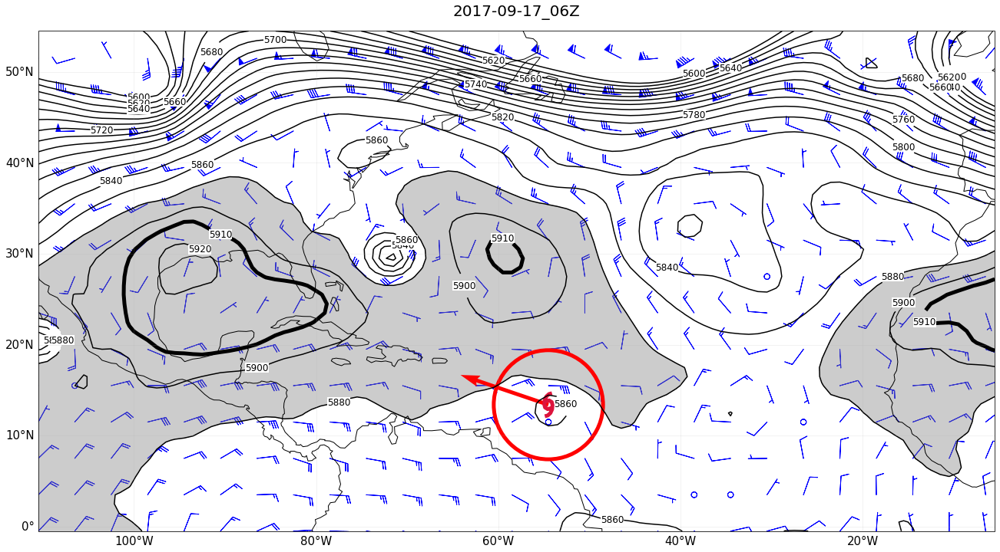

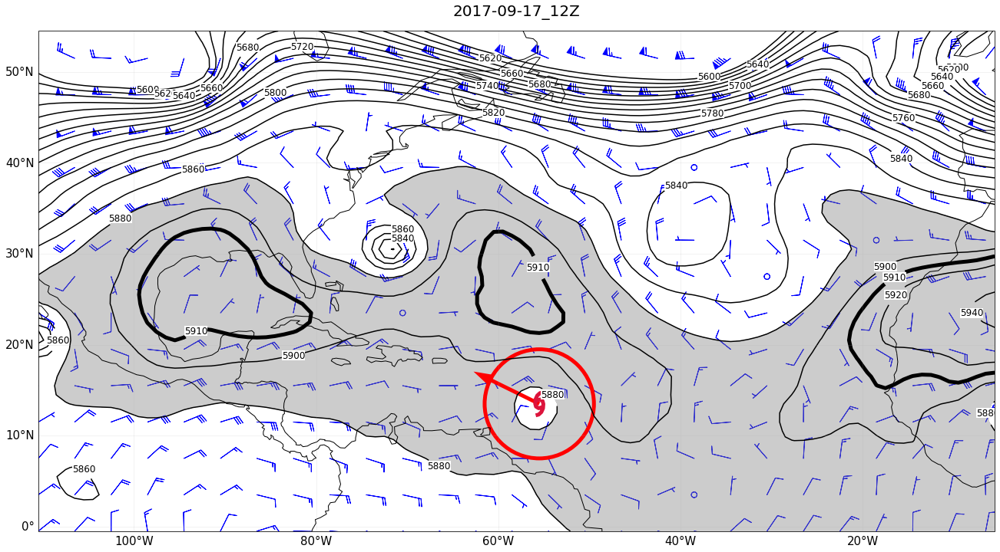

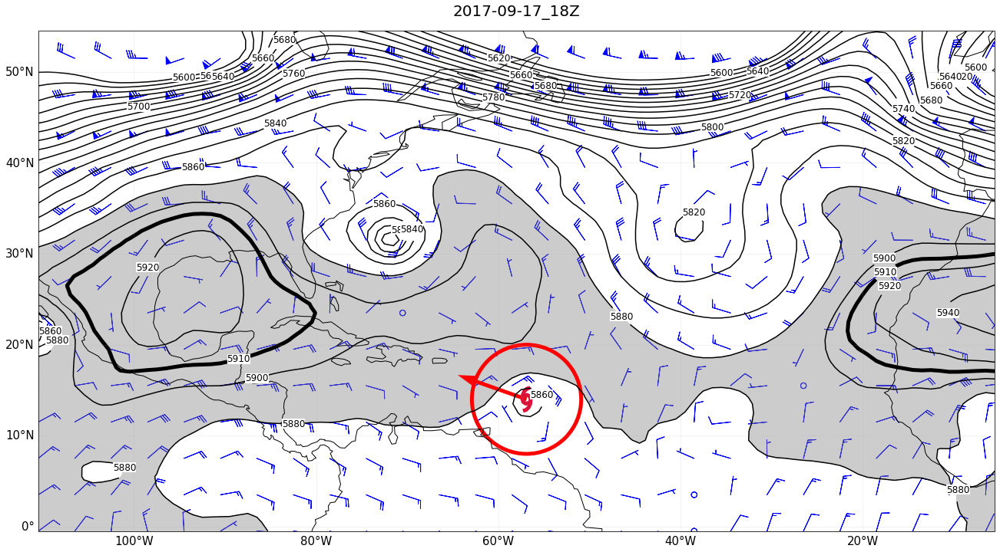

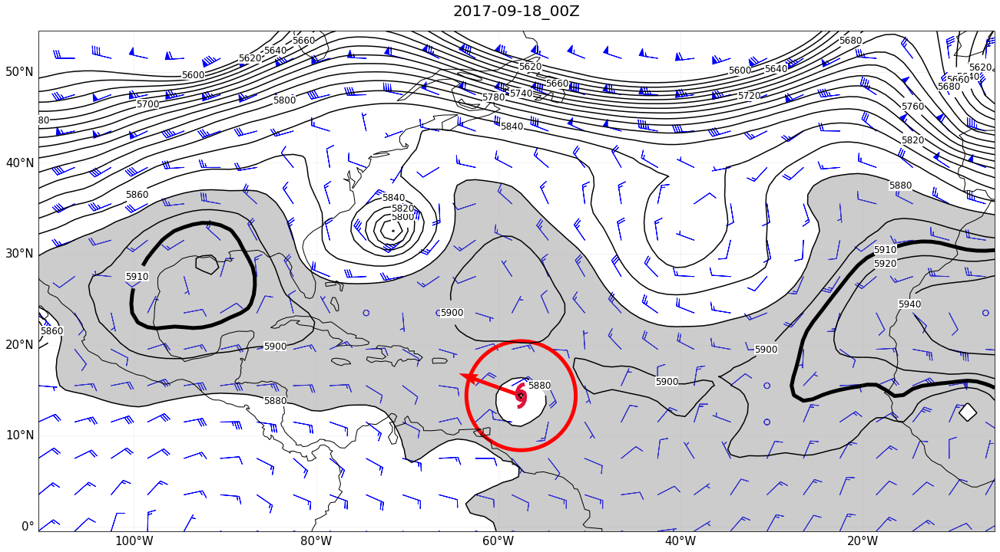

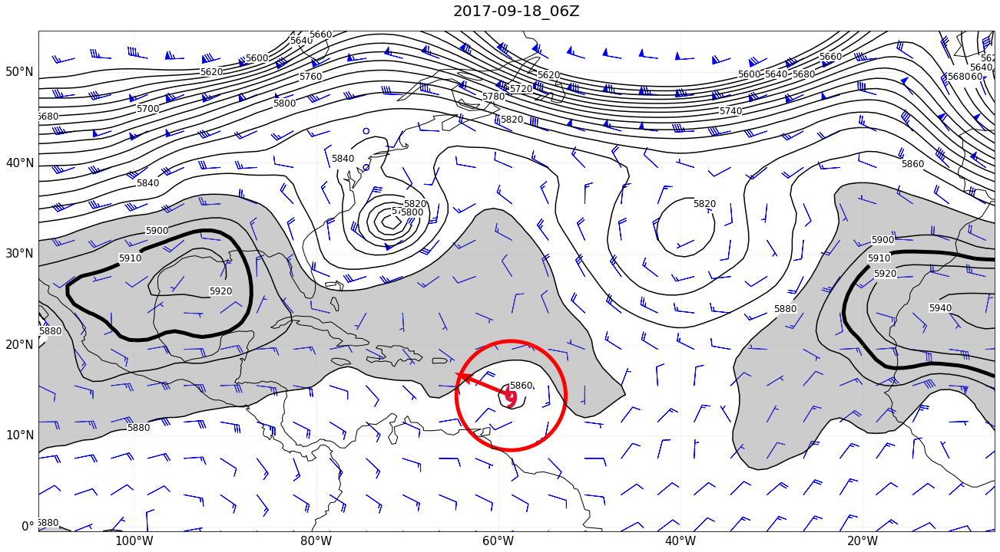

...

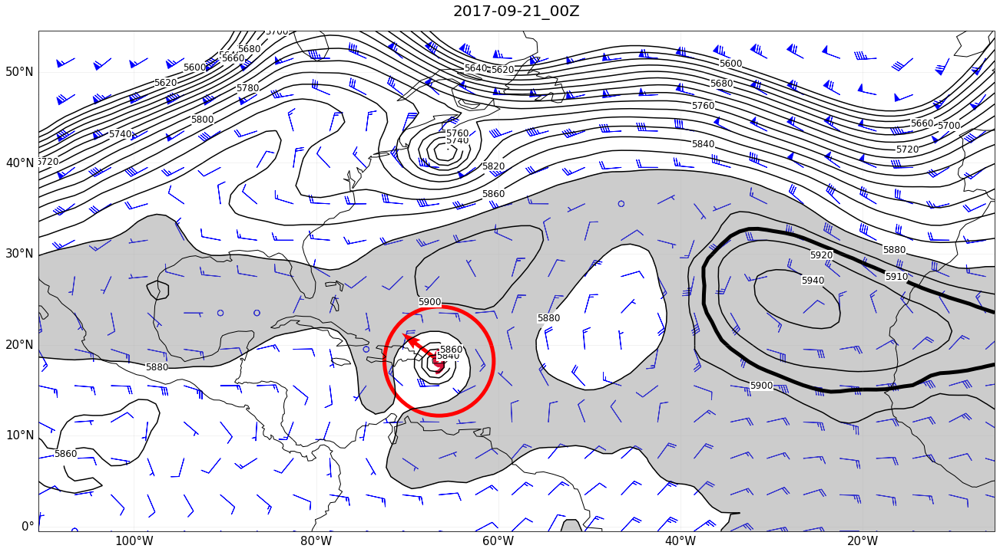

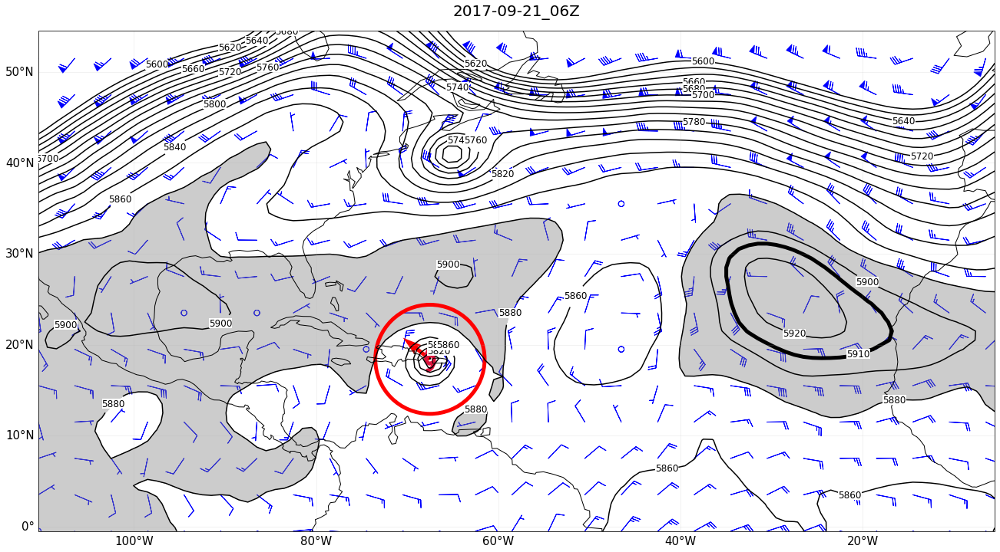

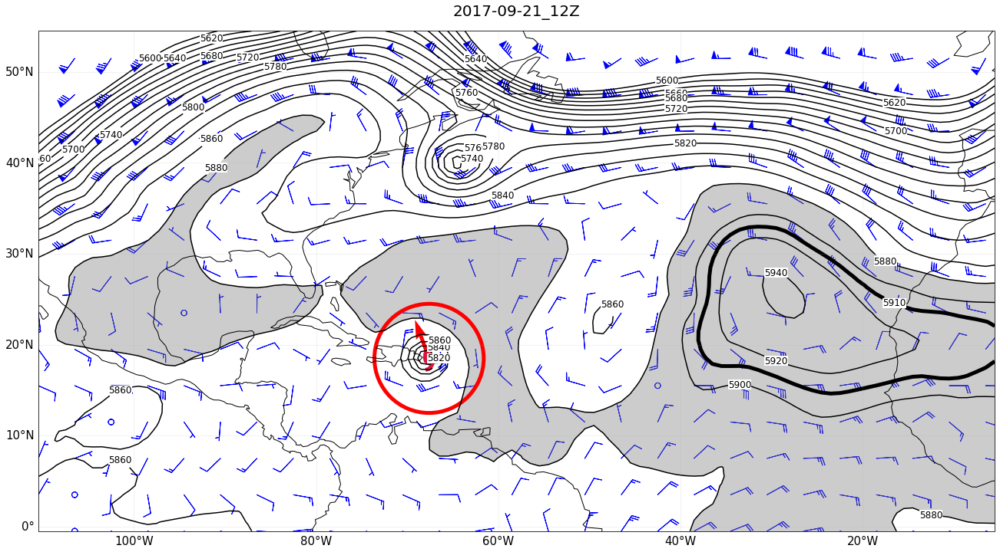

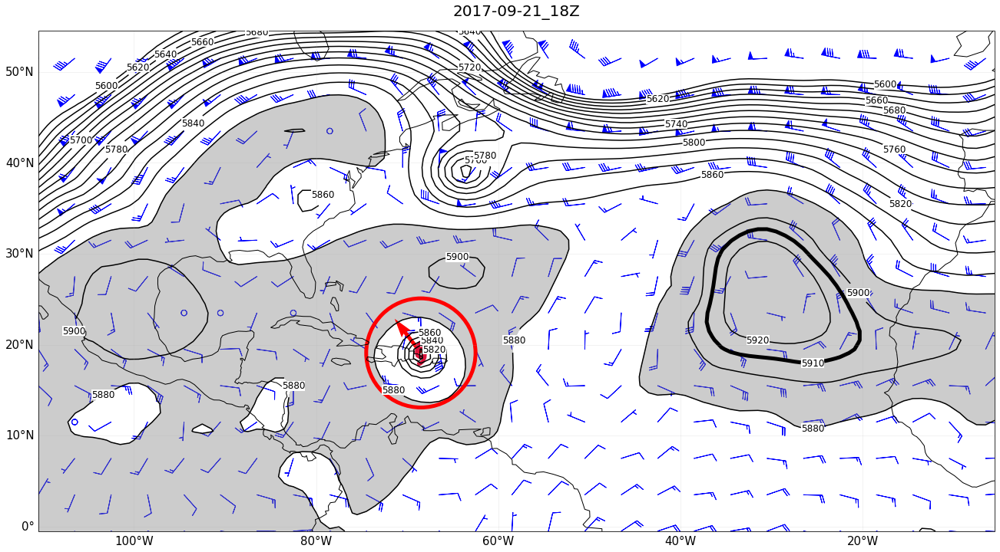

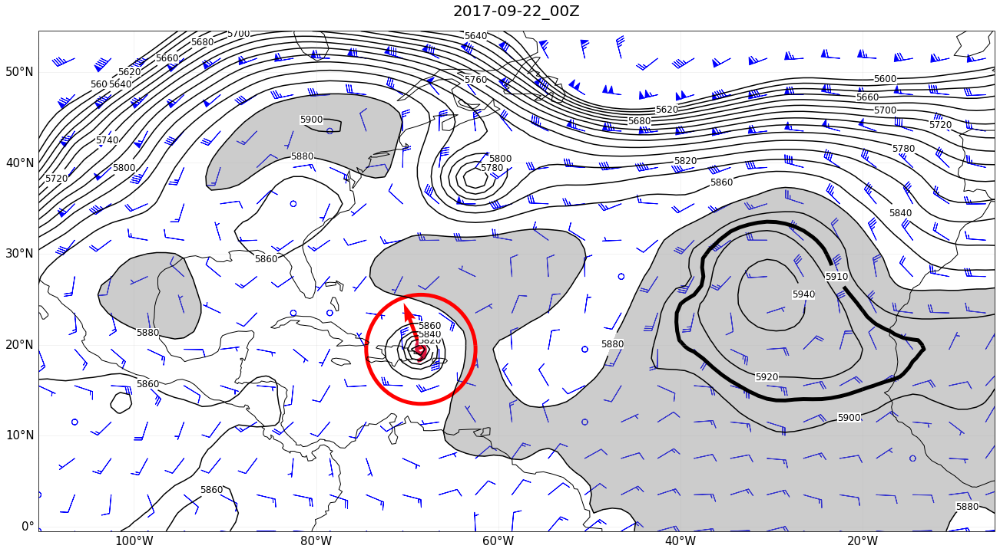

In [38]:
# gs = gridspec.GridSpec(ncols=1,nrows=1)
print("Model: "+model[0])

for i in np.arange(0,1):
    fig = plt.figure(figsize=(24,12))
    ax1 = plt.subplot(111,projection = ccrs.PlateCarree() )
    m1 = setup_m(ax1)
    m1.set_extent([lon[0],lon[-1],lat[0],lat[-1]],crs=ccrs.PlateCarree())

    # plot wind at 500hPa
    plt.barbs(lon[::4],lat[::4],u2[i,int(np.where(lev==500)[0]),::4,::4],v2[i,int(np.where(lev==500)[0]),::4,::4],
              color='blue',barb_increments={'half':2,'full':4,'flag':20},length=7)
    
    #### total PV perturbation 
#     # plot contours
#     gh1 = plt.contour(lon,lat,pv[i,int(np.where(lev==500)[0]),:,:],colors='k')
#     # plot shading
#     plt.contourf(lon,lat,pv[i,int(np.where(lev==500)[0]),:,:],levels=[0,300],colors='grey',alpha=0.4)
    #### total PV perturbation 
    
##########################################################


    ##### geopotential height
    plt.contourf(lon2,lat2,h2[i,int(np.where(lev==500)[0]),:,:],colors='grey',alpha=0.4,levels=[5880,6200])
    
    gh2 = plt.contour(lon2,lat2,h2[i,int(np.where(lev==500)[0]),:,:],colors='k',linewidths=5,levels=np.arange(5910,5920,10))

    gh1 = plt.contour(lon2,lat2,h2[i,int(np.where(lev==500)[0]),:,:],colors='k',levels=np.arange(5600,6100,20))
    
    ##### geopotential height
    
    # plot TC circle and dlm steering flow
    # https://stackoverflow.com/questions/52105543/drawing-circles-with-cartopy-in-orthographic-projection

    plt.quiver(lon_TC_center[i],lat_TC_center[i],u_dlm[i],v_dlm[i],color='red',
              width=0.004,scale=5,scale_units='inches')
    ax1.add_patch(mpatches.Circle(xy=[lon_TC_center[i],lat_TC_center[i]],linewidth=5,
                                  radius=6,fill=False,color='red',transform=ccrs.PlateCarree()))
    
    # hurricane symbol
    hurricane = get_hurricane()
    plt.scatter([lon_TC_center[i]],[lat_TC_center[i]],s=900,marker=hurricane,
                edgecolors="crimson", facecolors='none', linewidth=5)
    
    # label contours
    l1 = m1.clabel(gh1,fmt='%g',inline_spacing=2,fontsize=12)
    l2 = m1.clabel(gh2,fmt='%g',inline_spacing=2,fontsize=12)
    for l in l1+l2:
        l.set_rotation(0)
    [txt.set_backgroundcolor('white') for txt in l1];
    [txt.set_bbox(dict(facecolor='white', edgecolor='none', pad=0)) for txt in l1];
    [txt.set_backgroundcolor('white') for txt in l2];
    [txt.set_bbox(dict(facecolor='white', edgecolor='none', pad=0)) for txt in l2];
    
    tmp = str(np.array(time[i]))
    timestr = tmp[0:10]+'_'+tmp[11:13]+'Z'
    plt.title(timestr)
    
    fig.patch.set_facecolor('white')
    ax1.patch.set_facecolor('white')
    fname = '/home/twb/tmp/geopotential_height_'+model[0]+'_'+timestr+'.png'
    plt.savefig(fname,dpi=900,bbox_inches='tight')
    
# ax2 = fig.add_subplot(gs[0,1],projection=ccrs.PlateCarree())
# m2 = setup_m(ax2)
# m2.set_extent([lon[0],lon[-1],lat[0],lat[-1]],crs=ccrs.PlateCarree())
# plt.barbs(lon[::4],lat[::4],u2[0,int(np.where(lev==500)[0]),::4,::4],v2[0,int(np.where(lev==500)[0]),::4,::4],
#           color='blue',barb_increments={'half':2,'full':4,'flag':20},length=5)
# plt.contourf(lon2,lat2,h2[0,int(np.where(lev==500)[0]),:,:],colors='grey',alpha=0.4,levels=[5880,6200])
# gh2 = plt.contour(lon2,lat2,h2[0,int(np.where(lev==500)[0]),:,:],colors='k',levels=np.arange(5600,6100,20),rotation='horizontal')
# l2 = m2.clabel(gh2,fmt='%g',inline_spacing=2,fontsize=12)
# for l in l2:
#     l.set_rotation(0)
# [txt.set_backgroundcolor('white') for txt in l2];
# [txt.set_bbox(dict(facecolor='white', edgecolor='none', pad=0)) for txt in l2];

# plt.title('Geopotential Height @ 500mb');

### plot streamfunction 

In [43]:
f = '/archive/twb/pv_inversion/GFS/2017091700/20170917_00Z_pvb.nc'
ds = xr.open_dataset(f)
psi = ds['psi']
lon = ds['lon']
lat = ds['lat']

Text(0.5, 1.0, 'Streamfunction $\\psi$')

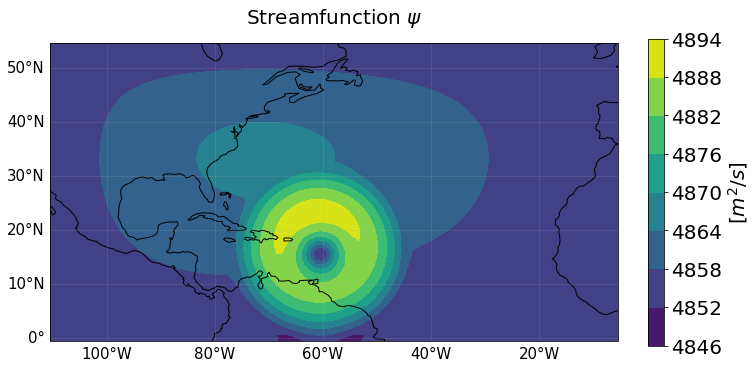

In [65]:
i=6
fig = plt.figure(figsize=(11,8))
ax1 = plt.subplot(111,projection = ccrs.PlateCarree() )
m1 = setup_m(ax1)
m1.set_extent([lon[0],lon[-1],lat[0],lat[-1]],crs=ccrs.PlateCarree())

sf = plt.contourf(lon,lat,psi[i,int(np.where(lev==500)[0]),:,:])
plt.colorbar(sf,label='$[m^2/s]$',fraction=0.025)
plt.title('Streamfunction $\psi$')

boolean indexing in python makes no sense

https://numpy.org/devdocs/reference/arrays.indexing.html

In [41]:
psi

<xarray.DataArray 'psi' (time: 40, lev: 12, lat: 56, lon: 106)>
[2849280 values with dtype=float32]
Coordinates:
  * lon      (lon) float32 249.5 250.5 251.5 252.5 ... 351.5 352.5 353.5 354.5
  * lat      (lat) float32 -0.5 0.5 1.5 2.5 3.5 4.5 ... 50.5 51.5 52.5 53.5 54.5
  * lev      (lev) float32 1e+03 925.0 850.0 700.0 ... 200.0 150.0 100.0 70.0
  * time     (time) datetime64[ns] 2017-09-17T06:00:00 ... 2017-09-27